In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

# Use the kagglehub client library to attach Kaggle resources like competitions, datasets, and models to your session
# Learn more about kagglehub: https://github.com/Kaggle/kagglehub/blob/main/README.md

import kagglehub
# kagglehub.dataset_download('<owner>/<dataset-slug>')

/kaggle/input/datasets/aliyachomo/pantvillege1/README.dataset.txt
/kaggle/input/datasets/aliyachomo/pantvillege1/README.roboflow.txt
/kaggle/input/datasets/aliyachomo/pantvillege1/valid/Cassava___mosaic_disease/624911036_jpg.rf.ac9da4d61a3cd99138a802daefd1229f.jpg
/kaggle/input/datasets/aliyachomo/pantvillege1/valid/Cassava___mosaic_disease/735041254_jpg.rf.cfa984d2b03def2bd55e9fe12b5363b6.jpg
/kaggle/input/datasets/aliyachomo/pantvillege1/valid/Cassava___mosaic_disease/535503922_jpg.rf.536e0d87f5644379a3279410d3e9a71f.jpg
/kaggle/input/datasets/aliyachomo/pantvillege1/valid/Cassava___mosaic_disease/4250754910_jpg.rf.c64189f92873ae3d824276f1c32c5a8f.jpg
/kaggle/input/datasets/aliyachomo/pantvillege1/valid/Cassava___mosaic_disease/3276292509_jpg.rf.889915ea0753493dc7944ddcd1d47765.jpg
/kaggle/input/datasets/aliyachomo/pantvillege1/valid/Cassava___mosaic_disease/131507385_jpg.rf.83d57d4fa4f398b8914ad5cdab101fc1.jpg
/kaggle/input/datasets/aliyachomo/pantvillege1/valid/Cassava___mosaic_dis

In [2]:
import os

dataset_path = "/kaggle/input"

for dirname, dirnames, filenames in os.walk(dataset_path):
    print("Folder:", dirname)
    
    # show only first 5 files
    for file in filenames[:5]:
        print("   ", file)
    
    print("-"*50)

Folder: /kaggle/input
--------------------------------------------------
Folder: /kaggle/input/datasets
--------------------------------------------------
Folder: /kaggle/input/datasets/aliyachomo
--------------------------------------------------
Folder: /kaggle/input/datasets/aliyachomo/pantvillege1
    README.dataset.txt
    README.roboflow.txt
--------------------------------------------------
Folder: /kaggle/input/datasets/aliyachomo/pantvillege1/valid
--------------------------------------------------
Folder: /kaggle/input/datasets/aliyachomo/pantvillege1/valid/Cassava___mosaic_disease
    624911036_jpg.rf.ac9da4d61a3cd99138a802daefd1229f.jpg
    735041254_jpg.rf.cfa984d2b03def2bd55e9fe12b5363b6.jpg
    535503922_jpg.rf.536e0d87f5644379a3279410d3e9a71f.jpg
    4250754910_jpg.rf.c64189f92873ae3d824276f1c32c5a8f.jpg
    3276292509_jpg.rf.889915ea0753493dc7944ddcd1d47765.jpg
--------------------------------------------------
Folder: /kaggle/input/datasets/aliyachomo/pantvillege1/val

In [6]:
import os

print(os.listdir("/kaggle/input"))

['datasets']


In [8]:
train_path = "/kaggle/input/datasets/aliyachomo/pantvillege1/"

print(os.listdir(train_path))

['README.dataset.txt', 'README.roboflow.txt', 'valid', 'test', 'train']


In [9]:
import os

dataset_path = "/kaggle/input/datasets/aliyachomo/plantvillege1/"

for root, dirs, files in os.walk(dataset_path):

    level = root.replace(dataset_path, '').count(os.sep)

    indent = ' ' * 4 * level

    print(f"{indent}{os.path.basename(root)}/")

    subindent = ' ' * 4 * (level + 1)

    for f in files[:3]:
        print(f"{subindent}{f}")

In [14]:
import os

train_path = "/kaggle/input/datasets/aliyachomo/pantvillege1/train/"

for cls in os.listdir(train_path):

    class_path = os.path.join(train_path, cls)

    print(cls, ":", len(os.listdir(class_path)))

Cassava___mosaic_disease : 2829
Cassava___brown_streak_disease : 2715
Cassava___bacterial_blight : 1283
Cassava___green_mottle : 2971
Cassava___healthy : 2748


In [15]:
import os
import random
import shutil

# =========================================================
# ORIGINAL TRAIN DATASET PATH
# =========================================================

original_train_path = "/kaggle/input/datasets/aliyachomo/pantvillege1/train/"

# =========================================================
# NEW BALANCED DATASET PATH
# =========================================================

balanced_train_path = "/kaggle/working/balanced_train"

# =========================================================
# DELETE OLD FOLDER IF EXISTS
# =========================================================

if os.path.exists(balanced_train_path):
    shutil.rmtree(balanced_train_path)

os.makedirs(balanced_train_path)

# =========================================================
# IMAGES TO KEEP PER CLASS
# =========================================================

TARGET_IMAGES = 2000

# =========================================================
# CREATE BALANCED DATASET
# =========================================================

for cls in os.listdir(original_train_path):

    class_path = os.path.join(original_train_path, cls)

    images = os.listdir(class_path)

    # Shuffle randomly
    random.shuffle(images)

    # Keep target images
    keep_images = images[:min(TARGET_IMAGES, len(images))]

    # Create class folder
    new_class_path = os.path.join(balanced_train_path, cls)

    os.makedirs(new_class_path)

    # Copy images
    for img in keep_images:

        src = os.path.join(class_path, img)

        dst = os.path.join(new_class_path, img)

        shutil.copy(src, dst)

    print(f"{cls} --> {len(keep_images)} images copied")

# =========================================================
# FINAL CHECK
# =========================================================

print("\nFinal Balanced Dataset:\n")

for cls in os.listdir(balanced_train_path):

    class_path = os.path.join(balanced_train_path, cls)

    print(cls, ":", len(os.listdir(class_path)))

Cassava___mosaic_disease --> 2000 images copied
Cassava___brown_streak_disease --> 2000 images copied
Cassava___bacterial_blight --> 1283 images copied
Cassava___green_mottle --> 2000 images copied
Cassava___healthy --> 2000 images copied

Final Balanced Dataset:

Cassava___green_mottle : 2000
Cassava___bacterial_blight : 1283
Cassava___healthy : 2000
Cassava___mosaic_disease : 2000
Cassava___brown_streak_disease : 2000


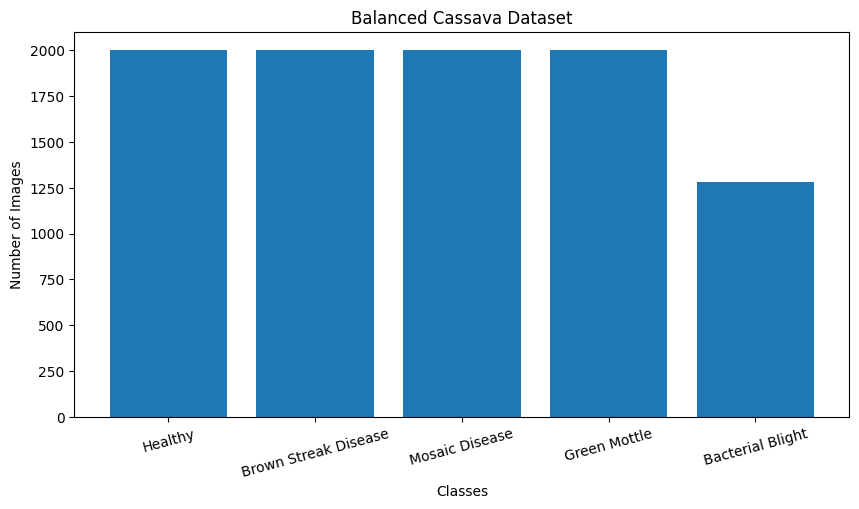

In [16]:
# =========================================================
# IMPORT LIBRARY
# =========================================================

import matplotlib.pyplot as plt

# =========================================================
# CLASS NAMES
# =========================================================

classes = [

    "Healthy",

    "Brown Streak Disease",

    "Mosaic Disease",

    "Green Mottle",

    "Bacterial Blight"

]

# =========================================================
# IMAGE COUNTS
# =========================================================

counts = [2000, 2000, 2000, 2000, 1283]

# =========================================================
# BAR PLOT
# =========================================================

plt.figure(figsize=(10,5))

plt.bar(classes, counts)

plt.title("Balanced Cassava Dataset")

plt.xlabel("Classes")

plt.ylabel("Number of Images")

plt.xticks(rotation=15)

plt.show()

In [18]:
import os

train_path = "/kaggle/input/datasets/aliyachomo/pantvillege1/valid/"

for cls in os.listdir(train_path):

    class_path = os.path.join(train_path, cls)

    print(cls, ":", len(os.listdir(class_path)))

Cassava___mosaic_disease : 326
Cassava___brown_streak_disease : 313
Cassava___bacterial_blight : 148
Cassava___green_mottle : 343
Cassava___healthy : 318


In [19]:
import os

train_path = "/kaggle/input/datasets/aliyachomo/pantvillege1/test/"

for cls in os.listdir(train_path):

    class_path = os.path.join(train_path, cls)

    print(cls, ":", len(os.listdir(class_path)))

Cassava___mosaic_disease : 436
Cassava___brown_streak_disease : 418
Cassava___bacterial_blight : 196
Cassava___green_mottle : 457
Cassava___healthy : 423


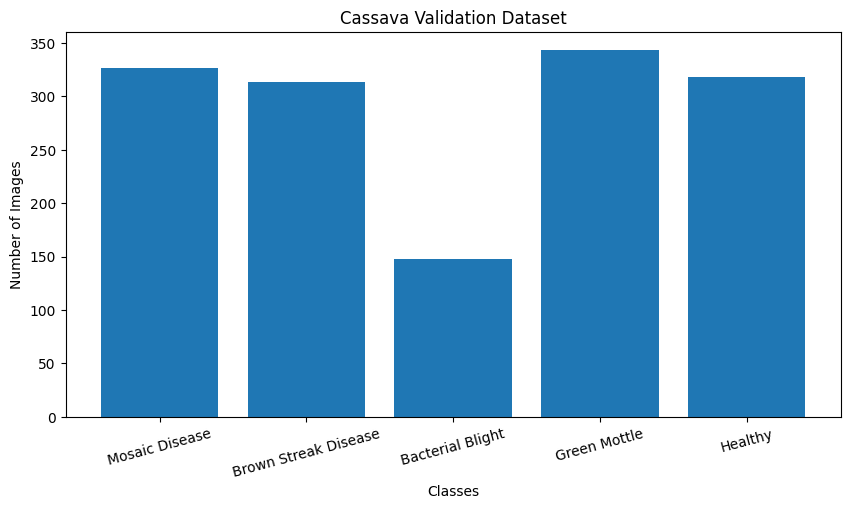

In [20]:
# =========================================================
# IMPORT LIBRARY
# =========================================================

import matplotlib.pyplot as plt

# =========================================================
# VALID DATASET CLASSES
# =========================================================

classes = [

    "Mosaic Disease",

    "Brown Streak Disease",

    "Bacterial Blight",

    "Green Mottle",

    "Healthy"

]

# =========================================================
# VALID IMAGE COUNTS
# =========================================================

counts = [326, 313, 148, 343, 318]

# =========================================================
# BAR PLOT
# =========================================================

plt.figure(figsize=(10,5))

plt.bar(classes, counts)

plt.title("Cassava Validation Dataset")

plt.xlabel("Classes")

plt.ylabel("Number of Images")

plt.xticks(rotation=15)

plt.show()

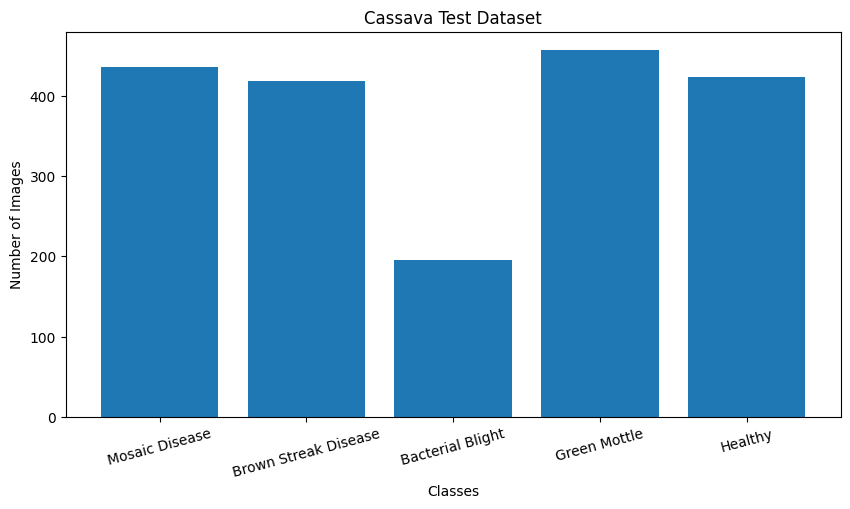

In [21]:

# =========================================================
# IMPORT LIBRARY
# =========================================================

import matplotlib.pyplot as plt

# =========================================================
# TEST DATASET CLASSES
# =========================================================

classes = [

    "Mosaic Disease",

    "Brown Streak Disease",

    "Bacterial Blight",

    "Green Mottle",

    "Healthy"

]

# =========================================================
# TEST IMAGE COUNTS
# =========================================================

counts = [436, 418, 196, 457, 423]

# =========================================================
# BAR PLOT
# =========================================================

plt.figure(figsize=(10,5))

plt.bar(classes, counts)

plt.title("Cassava Test Dataset")

plt.xlabel("Classes")

plt.ylabel("Number of Images")

plt.xticks(rotation=15)

plt.show()

In [22]:
labels = {

    0: "Mosaic Disease",

    1: "Brown Streak Disease",

    2: "Bacterial Blight",

    3: "Green Mottle",

    4: "Healthy"

}

print(labels)

{0: 'Mosaic Disease', 1: 'Brown Streak Disease', 2: 'Bacterial Blight', 3: 'Green Mottle', 4: 'Healthy'}


In [23]:
# IMPORT LIBRARIES
# =========================================================

import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt

from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.applications import EfficientNetB0
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout, GlobalAveragePooling2D
from tensorflow.keras.callbacks import (
    EarlyStopping,
    ModelCheckpoint,
    ReduceLROnPlateau
)

from sklearn.utils.class_weight import compute_class_weight


2026-05-20 17:38:01.332693: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:467] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1779298681.521856      57 cuda_dnn.cc:8579] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1779298681.578006      57 cuda_blas.cc:1407] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
W0000 00:00:1779298682.004568      57 computation_placer.cc:177] computation placer already registered. Please check linkage and avoid linking the same target more than once.
W0000 00:00:1779298682.004617      57 computation_placer.cc:177] computation placer already registered. Please check linkage and avoid linking the same target more than once.
W0000 00:00:1779298682.004620      57 computation_placer.cc:177] computation placer alr

In [25]:
# DATASET PATHS
# =========================================================

train_dir = "/kaggle/working/balanced_train"

valid_dir = "/kaggle/input/datasets/aliyachomo/pantvillege1/valid/"

test_dir = "/kaggle/input/datasets/aliyachomo/plantvillege1/test/"

In [26]:
# =========================================================
# SETTINGS
# =========================================================

IMG_SIZE = 224

BATCH_SIZE = 32

EPOCHS = 20

In [27]:
train_datagen = ImageDataGenerator(
    rescale=1./255,
    rotation_range=20,
    zoom_range=0.2,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    horizontal_flip=True,
    fill_mode='nearest'
)

valid_datagen = ImageDataGenerator(
    rescale=1./255
)

In [33]:
# =========================================================
# IMPORT LIBRARIES
# =========================================================

import os
import pandas as pd
from sklearn.model_selection import train_test_split

# =========================================================
# DATASET PATHS
# =========================================================

TRAIN_DIR = "/kaggle/working/balanced_train"
TEST_DIR  = "/kaggle/input/datasets/aliyachomo/pantvillege1/test/"

# =========================================================
# CREATE DATAFRAME FROM TRAIN FOLDERS
# =========================================================

data = []

classes = os.listdir(TRAIN_DIR)

for label in classes:

    class_path = os.path.join(TRAIN_DIR, label)

    if os.path.isdir(class_path):

        for img in os.listdir(class_path):

            data.append([

                os.path.join(label, img),   # relative image path
                label                       # class label
            ])

# =========================================================
# CREATE MAIN DATAFRAME
# =========================================================

df = pd.DataFrame(data, columns=['ID', 'Labels'])

print(df.head())

# =========================================================
# TRAIN / VALIDATION SPLIT
# =========================================================

train_df, val_df = train_test_split(
    df,
    test_size=0.2,
    stratify=df['Labels'],
    random_state=42
)

# =========================================================
# CREATE TEST DATAFRAME
# =========================================================

test_images = os.listdir(TEST_DIR)

test_df = pd.DataFrame({
    'ID': test_images
})

# =========================================================
# CHECK
# =========================================================

print("Train Shape:", train_df.shape)
print("Validation Shape:", val_df.shape)
print("Test Shape:", test_df.shape)

print("\nClasses:")
print(df['Labels'].unique())

                                                  ID                  Labels
0  Cassava___green_mottle/2839789012_jpg.rf.f11c5...  Cassava___green_mottle
1  Cassava___green_mottle/2362470842_jpg.rf.d3580...  Cassava___green_mottle
2  Cassava___green_mottle/2167049261_jpg.rf.5bacc...  Cassava___green_mottle
3  Cassava___green_mottle/3323187538_jpg.rf.59daa...  Cassava___green_mottle
4  Cassava___green_mottle/3591384657_jpg.rf.c60ea...  Cassava___green_mottle
Train Shape: (7426, 2)
Validation Shape: (1857, 2)
Test Shape: (5, 1)

Classes:
['Cassava___green_mottle' 'Cassava___bacterial_blight' 'Cassava___healthy'
 'Cassava___mosaic_disease' 'Cassava___brown_streak_disease']


In [37]:

IMG_SIZE = 224
BATCH_SIZE = 32
SEED = 42

In [63]:
# =========================================================
# IMPORTANT FIXES
# =========================================================

from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.applications.efficientnet import preprocess_input

# =========================================================
# CONVERT LABELS TO STRING
# =========================================================

train_df['Labels'] = train_df['Labels'].astype(str)

val_df['Labels'] = val_df['Labels'].astype(str)

# =========================================================
# TRAIN DATA GENERATOR
# =========================================================

train_datagen = ImageDataGenerator(

    preprocessing_function=preprocess_input,

    rotation_range=20,

    zoom_range=0.2,

    horizontal_flip=True

)

# =========================================================
# VALIDATION DATA GENERATOR
# =========================================================

valid_datagen = ImageDataGenerator(

    preprocessing_function=preprocess_input

)

# =========================================================
# TRAIN GENERATOR
# =========================================================

train_generator = train_datagen.flow_from_dataframe(

    dataframe=train_df,

    directory=TRAIN_DIR,

    x_col='ID',

    y_col='Labels',

    target_size=(IMG_SIZE, IMG_SIZE),

    batch_size=BATCH_SIZE,

    class_mode='categorical',

    shuffle=True,

    seed=SEED

)

# =========================================================
# VALIDATION GENERATOR
# =========================================================

valid_generator = valid_datagen.flow_from_dataframe(

    dataframe=val_df,

    directory=TRAIN_DIR,

    x_col='ID',

    y_col='Labels',

    target_size=(IMG_SIZE, IMG_SIZE),

    batch_size=BATCH_SIZE,

    class_mode='categorical',

    shuffle=False

)

# =========================================================
# CHECK CLASS INFO
# =========================================================

print("Class Indices:")
print(train_generator.class_indices)

print("Number of Classes:")
print(len(train_generator.class_indices))

Found 7426 validated image filenames belonging to 5 classes.
Found 1857 validated image filenames belonging to 5 classes.
Class Indices:
{'Cassava___bacterial_blight': 0, 'Cassava___brown_streak_disease': 1, 'Cassava___green_mottle': 2, 'Cassava___healthy': 3, 'Cassava___mosaic_disease': 4}
Number of Classes:
5


In [62]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.applications.efficientnet import preprocess_input

# =========================================================
# TEST DIRECTORY
# =========================================================

TEST_DIR = "/kaggle/input/datasets/aliyachomo/pantvillege1/test/"

# =========================================================
# TEST DATAGEN
# =========================================================

test_datagen = ImageDataGenerator(
    preprocessing_function=preprocess_input
)

# =========================================================
# TEST GENERATOR
# =========================================================

test_generator = test_datagen.flow_from_directory(

    TEST_DIR,

    target_size=(224,224),

    batch_size=32,

    class_mode='categorical',

    shuffle=False

)

# =========================================================
# CHECK
# =========================================================

print("Total Test Images:", test_generator.samples)

print("\nClass Indices:")
print(test_generator.class_indices)

Found 1930 images belonging to 5 classes.
Total Test Images: 1930

Class Indices:
{'Cassava___bacterial_blight': 0, 'Cassava___brown_streak_disease': 1, 'Cassava___green_mottle': 2, 'Cassava___healthy': 3, 'Cassava___mosaic_disease': 4}


In [39]:
import os
import json
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

import tensorflow as tf
import tensorflow_hub as hub

from sklearn.model_selection import train_test_split

from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout
from tensorflow.keras.callbacks import (
    EarlyStopping,
    ReduceLROnPlateau,
    ModelCheckpoint
)

In [40]:
import tensorflow as tf

print("TensorFlow Version:", tf.__version__)

print("GPU Available:",
      tf.config.list_physical_devices('GPU'))

TensorFlow Version: 2.19.0
GPU Available: [PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU'), PhysicalDevice(name='/physical_device:GPU:1', device_type='GPU')]


In [41]:
# =========================================================
# CLASS WEIGHTS
# =========================================================

classes = train_generator.classes

class_weights = compute_class_weight(

    class_weight='balanced',

    classes=np.unique(classes),

    y=classes

)

class_weights = dict(enumerate(class_weights))

print("\nClass Weights:\n")

print(class_weights)


Class Weights:

{0: np.float64(1.4475633528265108), 1: np.float64(0.92825), 2: np.float64(0.92825), 3: np.float64(0.92825), 4: np.float64(0.92825)}


In [45]:
from tensorflow.keras.applications import EfficientNetB0
from tensorflow.keras.models import Model
from tensorflow.keras.layers import (
    Dense,
    Dropout,
    GlobalAveragePooling2D
)
from tensorflow.keras.optimizers import Adam

# =========================================================
# LOAD PRETRAINED MODEL
# =========================================================

base_model = EfficientNetB0(

    weights=None,

    include_top=False,

    input_shape=(224,224,3)

)

# =========================================================
# LOAD PRETRAINED WEIGHTS
# =========================================================

base_model.load_weights(
      "/kaggle/input/datasets/aliyachomo/efficientnet01/efficientnetb0_notop.h5"
)

print("Weights Loaded Successfully!")

# =========================================================
# FINE TUNING
# =========================================================

base_model.trainable = True

# Freeze most layers
for layer in base_model.layers[:-20]:
    layer.trainable = False

# =========================================================
# CUSTOM HEAD
# =========================================================

x = base_model.output

x = GlobalAveragePooling2D()(x)

x = Dense(256, activation='relu')(x)

x = Dropout(0.3)(x)

x = Dense(128, activation='relu')(x)

x = Dropout(0.2)(x)

output = Dense(

    len(train_generator.class_indices),

    activation='softmax'

)(x)

# =========================================================
# FINAL MODEL
# =========================================================

model = Model(

    inputs=base_model.input,

    outputs=output

)

# =========================================================
# COMPILE MODEL
# =========================================================

model.compile(

    optimizer=Adam(learning_rate=0.0001),

    loss='categorical_crossentropy',

    metrics=['accuracy']

)

# =========================================================
# MODEL SUMMARY
# =========================================================

model.summary()

Weights Loaded Successfully!


Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_3       │ (None, 224, 224,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ rescaling_3         │ (None, 224, 224,  │          0 │ input_layer_3[0]… │
│ (Rescaling)         │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ normalization_3     │ (None, 224, 224,  │          7 │ rescaling_3[0][0] │
│ (Normalization)     │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_conv_pad       │ (None, 225, 225,  │          0 │ normalization_3[… │
│ (ZeroPadding2D)     │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_conv (Conv2D)  │ (None, 112, 112,  │        864 │ stem_conv_pad[0]… │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_bn             │ (None, 112, 112,  │        128 │ stem_conv[0][0]   │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_activation     │ (None, 112, 112,  │          0 │ stem_bn[0][0]     │
│ (Activation)        │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_dwconv      │ (None, 112, 112,  │        288 │ stem_activation[… │
│ (DepthwiseConv2D)   │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_bn          │ (None, 112, 112,  │        128 │ block1a_dwconv[0… │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_activation  │ (None, 112, 112,  │          0 │ block1a_bn[0][0]  │
│ (Activation)        │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_se_squeeze  │ (None, 32)        │          0 │ block1a_activati… │
│ (GlobalAveragePool… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_se_reshape  │ (None, 1, 1, 32)  │          0 │ block1a_se_squee… │
│ (Reshape)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_se_reduce   │ (None, 1, 1, 8)   │        264 │ block1a_se_resha… │
│ (Conv2D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_se_expand   │ (None, 1, 1, 32)  │        288 │ block1a_se_reduc… │
│ (Conv2D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_se_excite   │ (None, 112, 112,  │          0 │ block1a_activati… │
│ (Multiply)          │ 32)               │            │ block1a_se_expan… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_project_co… │ (None, 112, 112,  │        512 │ block1a_se_excit… │
│ (Conv2D)            │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_project_bn  │ (None, 112, 112,  │         64 │ block1a_project_

 Total params: 4,411,048 (16.83 MB)

 Trainable params: 1,712,437 (6.53 MB)

 Non-trainable params: 2,698,611 (10.29 MB)

In [46]:
# =========================================================
# IMPORT CALLBACKS
# =========================================================

from tensorflow.keras.callbacks import (
    EarlyStopping,
    ReduceLROnPlateau,
    ModelCheckpoint
)

# =========================================================
# EARLY STOPPING
# =========================================================

early_stop = EarlyStopping(

    monitor='val_accuracy',

    patience=5,

    restore_best_weights=True,

    verbose=1

)

# =========================================================
# REDUCE LEARNING RATE
# =========================================================

reduce_lr = ReduceLROnPlateau(

    monitor='val_loss',

    factor=0.3,

    patience=2,

    min_lr=1e-6,

    verbose=1

)

# =========================================================
# MODEL CHECKPOINT
# =========================================================

checkpoint = ModelCheckpoint(

    filepath="/kaggle/working/best_model.keras",

    monitor='val_accuracy',

    save_best_only=True,

    mode='max',

    verbose=1

)

# =========================================================
# CALLBACK LIST
# =========================================================

callbacks = [

    early_stop,

    reduce_lr,

    checkpoint

]

print("Callbacks Ready 🚀")

Callbacks Ready 🚀


In [47]:
history = model.fit(

    train_generator,

    validation_data=valid_generator,

    epochs=20,

    callbacks=callbacks

)

/usr/local/lib/python3.12/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Epoch 1/20


I0000 00:00:1779299173.235179     278 service.cc:152] XLA service 0x7cf428016950 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1779299173.235217     278 service.cc:160]   StreamExecutor device (0): Tesla T4, Compute Capability 7.5
I0000 00:00:1779299173.235221     278 service.cc:160]   StreamExecutor device (1): Tesla T4, Compute Capability 7.5
I0000 00:00:1779299175.959251     278 cuda_dnn.cc:529] Loaded cuDNN version 91002
2026-05-20 17:46:23.760639: E external/local_xla/xla/stream_executor/cuda/cuda_timer.cc:86] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.
2026-05-20 17:46:23.903598: E external/local_xla/xla/stream_executor/cuda/cuda_timer.cc:86] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.
2026-05-20 17:46:24.244853: E external/local_xl

 67/233 ━━━━━━━━━━━━━━━━━━━━ 1:00 365ms/step - accuracy: 0.2500 - loss: 1.6035

2026-05-20 17:47:07.611992: E external/local_xla/xla/stream_executor/cuda/cuda_timer.cc:86] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.
2026-05-20 17:47:07.746400: E external/local_xla/xla/stream_executor/cuda/cuda_timer.cc:86] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.
2026-05-20 17:47:08.056426: E external/local_xla/xla/stream_executor/cuda/cuda_timer.cc:86] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.
2026-05-20 17:47:08.197823: E external/local_xla/xla/stream_executor/cuda/cuda_timer.cc:86] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.
2026-05-20 17:47:08.339109: E external/local_xla/xla/stream_

233/233 ━━━━━━━━━━━━━━━━━━━━ 0s 438ms/step - accuracy: 0.3251 - loss: 1.5115

2026-05-20 17:48:33.577833: E external/local_xla/xla/stream_executor/cuda/cuda_timer.cc:86] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.
2026-05-20 17:48:33.712857: E external/local_xla/xla/stream_executor/cuda/cuda_timer.cc:86] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.
2026-05-20 17:48:34.477275: E external/local_xla/xla/stream_executor/cuda/cuda_timer.cc:86] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.
2026-05-20 17:48:34.612097: E external/local_xla/xla/stream_executor/cuda/cuda_timer.cc:86] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.



Epoch 1: val_accuracy improved from -inf to 0.58158, saving model to /kaggle/working/best_model.keras
233/233 ━━━━━━━━━━━━━━━━━━━━ 159s 533ms/step - accuracy: 0.3254 - loss: 1.5110 - val_accuracy: 0.5816 - val_loss: 1.0870 - learning_rate: 1.0000e-04
Epoch 2/20
233/233 ━━━━━━━━━━━━━━━━━━━━ 0s 360ms/step - accuracy: 0.5643 - loss: 1.1124
Epoch 2: val_accuracy improved from 0.58158 to 0.63382, saving model to /kaggle/working/best_model.keras
233/233 ━━━━━━━━━━━━━━━━━━━━ 89s 383ms/step - accuracy: 0.5643 - loss: 1.1123 - val_accuracy: 0.6338 - val_loss: 0.9690 - learning_rate: 1.0000e-04
Epoch 3/20
233/233 ━━━━━━━━━━━━━━━━━━━━ 0s 359ms/step - accuracy: 0.6214 - loss: 0.9729
Epoch 3: val_accuracy improved from 0.63382 to 0.63597, saving model to /kaggle/working/best_model.keras
233/233 ━━━━━━━━━━━━━━━━━━━━ 89s 382ms/step - accuracy: 0.6214 - loss: 0.9728 - val_accuracy: 0.6360 - val_loss: 0.9368 - learning_rate: 1.0000e-04
Epoch 4/20
233/233 ━━━━━━━━━━━━━━━━━━━━ 0s 358ms/step - accuracy: 

In [48]:
loss, accuracy = model.evaluate(valid_generator)

print("Final Validation Accuracy:", accuracy)

59/59 ━━━━━━━━━━━━━━━━━━━━ 5s 76ms/step - accuracy: 0.7043 - loss: 0.8077
Final Validation Accuracy: 0.6887452602386475


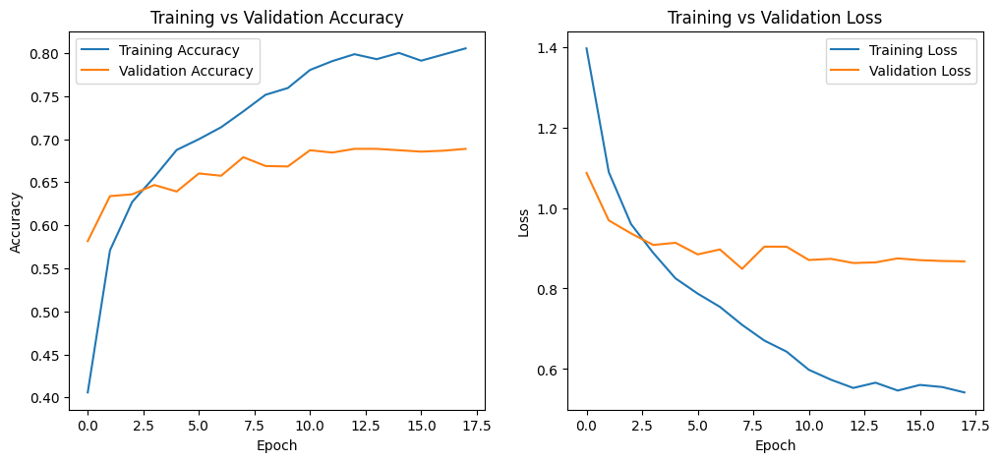

In [50]:
import matplotlib.pyplot as plt

# Accuracy
plt.figure(figsize=(12,5))

plt.subplot(1,2,1)
plt.plot(history.history['accuracy'], label='Training Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.title('Training vs Validation Accuracy')
plt.legend()

# Loss
plt.subplot(1,2,2)
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training vs Validation Loss')
plt.legend()

plt.show()

In [51]:
print("Final Training Accuracy:", history.history['accuracy'][-1])
print("Final Validation Accuracy:", history.history['val_accuracy'][-1])

print("Final Training Loss:", history.history['loss'][-1])
print("Final Validation Loss:", history.history['val_loss'][-1])

Final Training Accuracy: 0.8054134249687195
Final Validation Accuracy: 0.6887452602386475
Final Training Loss: 0.5418800711631775
Final Validation Loss: 0.8673412799835205


59/59 ━━━━━━━━━━━━━━━━━━━━ 18s 195ms/step

ACCURACY
Accuracy: 0.6887

PRECISION
Precision: 0.7141

RECALL
Recall: 0.6887

F1 SCORE
F1 Score: 0.6909

CLASSIFICATION REPORT
                                precision    recall  f1-score   support

    Cassava___bacterial_blight       0.63      0.65      0.64       257
Cassava___brown_streak_disease       0.74      0.62      0.68       400
        Cassava___green_mottle       0.81      0.59      0.68       400
             Cassava___healthy       0.55      0.81      0.65       400
      Cassava___mosaic_disease       0.81      0.76      0.78       400

                      accuracy                           0.69      1857
                     macro avg       0.71      0.69      0.69      1857
                  weighted avg       0.71      0.69      0.69      1857



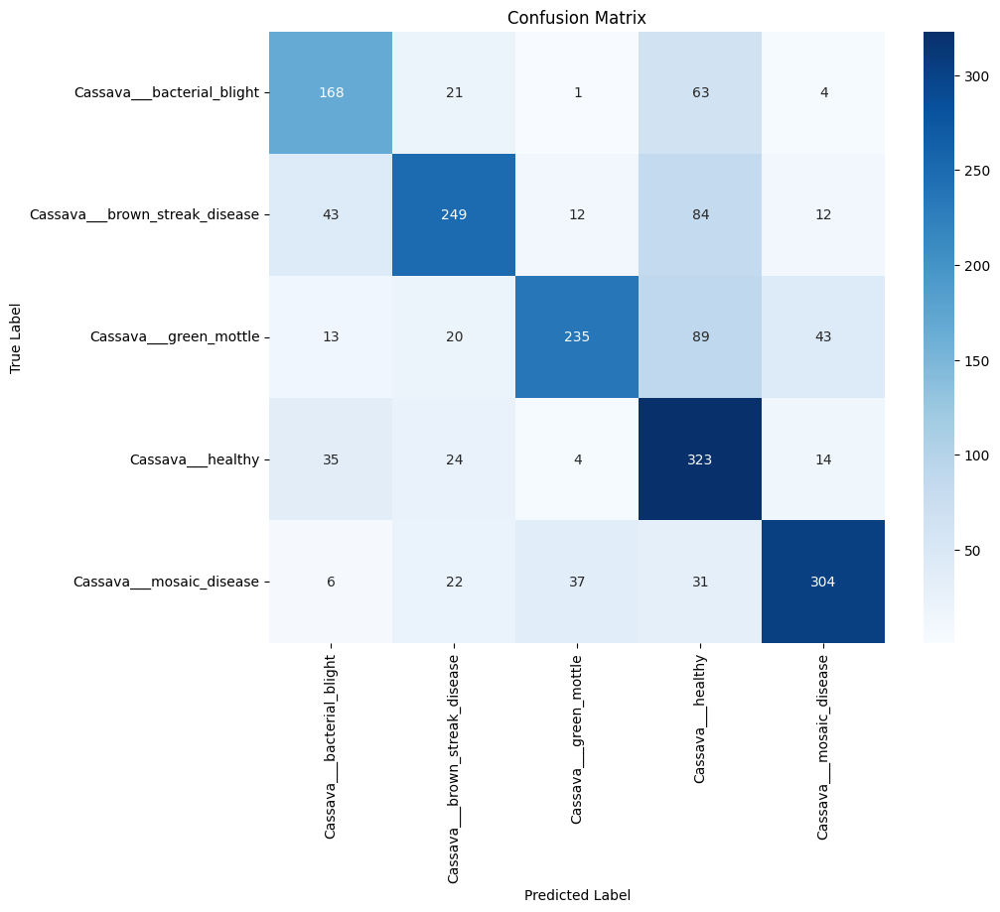

In [52]:
# =========================================================
# IMPORT LIBRARIES
# =========================================================

import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.metrics import (

    classification_report,

    confusion_matrix,

    accuracy_score,

    precision_score,

    recall_score,

    f1_score

)

# =========================================================
# RESET GENERATOR
# IMPORTANT BEFORE PREDICTION
# =========================================================

valid_generator.reset()

# =========================================================
# MODEL PREDICTIONS
# =========================================================

pred_probs = model.predict(
    valid_generator,
    verbose=1
)

# Convert probabilities to class index
pred_classes = np.argmax(
    pred_probs,
    axis=1
)

# True labels
true_classes = valid_generator.classes

# =========================================================
# ACCURACY
# =========================================================

accuracy = accuracy_score(
    true_classes,
    pred_classes
)

print("\n==============================")
print("ACCURACY")
print("==============================")

print(f"Accuracy: {accuracy:.4f}")

# =========================================================
# PRECISION
# =========================================================

precision = precision_score(
    true_classes,
    pred_classes,
    average='weighted'
)

print("\n==============================")
print("PRECISION")
print("==============================")

print(f"Precision: {precision:.4f}")

# =========================================================
# RECALL
# =========================================================

recall = recall_score(
    true_classes,
    pred_classes,
    average='weighted'
)

print("\n==============================")
print("RECALL")
print("==============================")

print(f"Recall: {recall:.4f}")

# =========================================================
# F1 SCORE
# =========================================================

f1 = f1_score(
    true_classes,
    pred_classes,
    average='weighted'
)

print("\n==============================")
print("F1 SCORE")
print("==============================")

print(f"F1 Score: {f1:.4f}")

# =========================================================
# CLASSIFICATION REPORT
# =========================================================

print("\n==============================")
print("CLASSIFICATION REPORT")
print("==============================")

class_names = list(
    valid_generator.class_indices.keys()
)

print(classification_report(

    true_classes,

    pred_classes,

    target_names=class_names

))

# =========================================================
# CONFUSION MATRIX
# =========================================================

cm = confusion_matrix(
    true_classes,
    pred_classes
)

# =========================================================
# PLOT CONFUSION MATRIX
# =========================================================

plt.figure(figsize=(10,8))

sns.heatmap(

    cm,

    annot=True,

    fmt='d',

    cmap='Blues',

    xticklabels=class_names,

    yticklabels=class_names

)

plt.title("Confusion Matrix")

plt.xlabel("Predicted Label")

plt.ylabel("True Label")

plt.show()

In [53]:
from sklearn.metrics import classification_report
import numpy as np

# Predictions
pred_probs = model.predict(valid_generator)

predictions = np.argmax(pred_probs, axis=1)

# True labels
true_labels = valid_generator.classes

# Report
print(classification_report(
    true_labels,
    predictions
))

59/59 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step
              precision    recall  f1-score   support

           0       0.63      0.65      0.64       257
           1       0.74      0.62      0.68       400
           2       0.81      0.59      0.68       400
           3       0.55      0.81      0.65       400
           4       0.81      0.76      0.78       400

    accuracy                           0.69      1857
   macro avg       0.71      0.69      0.69      1857
weighted avg       0.71      0.69      0.69      1857



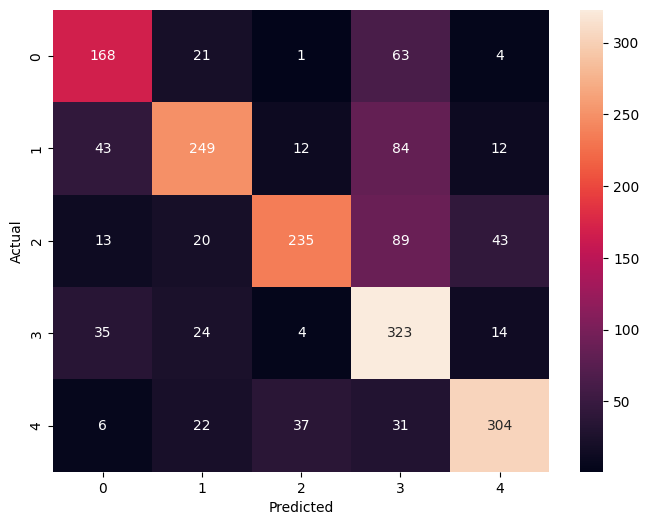

In [54]:
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns

cm = confusion_matrix(
    true_labels,
    predictions
)

plt.figure(figsize=(8,6))

sns.heatmap(
    cm,
    annot=True,
    fmt='d'
)

plt.xlabel("Predicted")
plt.ylabel("Actual")

plt.show()

In [56]:
model.save(
    "/kaggle/working/plant_disease_model.keras"
)

In [57]:
import os

for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames[:5]:
        print(os.path.join(dirname, filename))

/kaggle/input/datasets/aliyachomo/pantvillege1/README.dataset.txt
/kaggle/input/datasets/aliyachomo/pantvillege1/README.roboflow.txt
/kaggle/input/datasets/aliyachomo/pantvillege1/valid/Cassava___mosaic_disease/624911036_jpg.rf.ac9da4d61a3cd99138a802daefd1229f.jpg
/kaggle/input/datasets/aliyachomo/pantvillege1/valid/Cassava___mosaic_disease/735041254_jpg.rf.cfa984d2b03def2bd55e9fe12b5363b6.jpg
/kaggle/input/datasets/aliyachomo/pantvillege1/valid/Cassava___mosaic_disease/535503922_jpg.rf.536e0d87f5644379a3279410d3e9a71f.jpg
/kaggle/input/datasets/aliyachomo/pantvillege1/valid/Cassava___mosaic_disease/4250754910_jpg.rf.c64189f92873ae3d824276f1c32c5a8f.jpg
/kaggle/input/datasets/aliyachomo/pantvillege1/valid/Cassava___mosaic_disease/3276292509_jpg.rf.889915ea0753493dc7944ddcd1d47765.jpg
/kaggle/input/datasets/aliyachomo/pantvillege1/valid/Cassava___brown_streak_disease/84787134_jpg.rf.2f9bf68dbbb0cf617f26042c2cd32c10.jpg
/kaggle/input/datasets/aliyachomo/pantvillege1/valid/Cassava___brown

Total Images Found: 1930


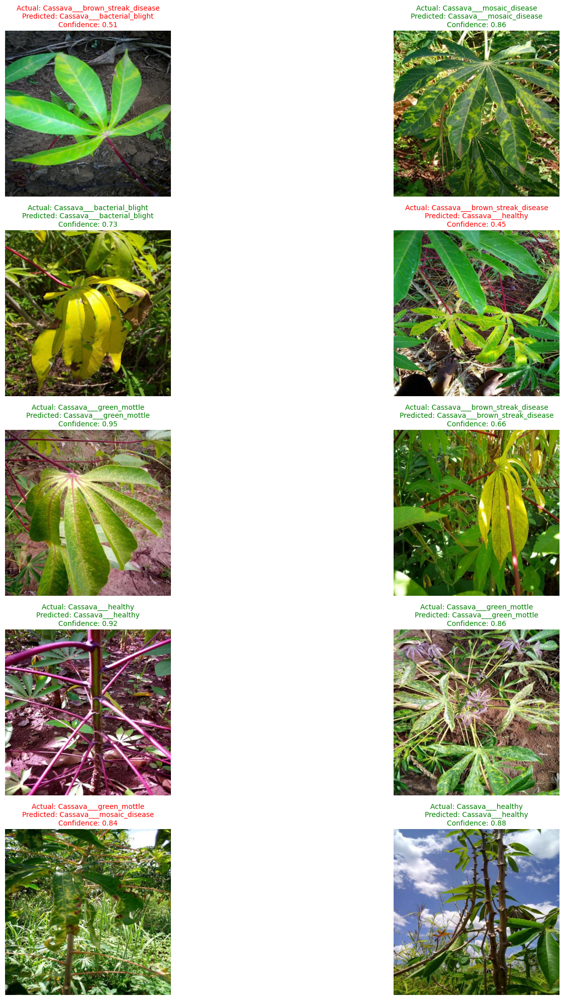

In [65]:
from tensorflow.keras.preprocessing import image
from tensorflow.keras.applications.efficientnet import preprocess_input

import matplotlib.pyplot as plt
import numpy as np
import os
import random
import glob

# =========================================================
# TEST DIRECTORY
# =========================================================

TEST_DIR = "/kaggle/input/datasets/aliyachomo/pantvillege1/test/"

# =========================================================
# CLASS NAMES
# =========================================================

class_names = {

    0: 'Cassava___bacterial_blight',

    1: 'Cassava___brown_streak_disease',

    2: 'Cassava___green_mottle',

    3: 'Cassava___healthy',

    4: 'Cassava___mosaic_disease'

}

# =========================================================
# GET ALL IMAGE PATHS
# =========================================================

image_paths = glob.glob(TEST_DIR + "*/*.jpg")

print("Total Images Found:", len(image_paths))

# =========================================================
# SELECT RANDOM IMAGES
# =========================================================

sample_size = min(10, len(image_paths))

sample_images = random.sample(
    image_paths,
    sample_size
)

# =========================================================
# CREATE FIGURE
# =========================================================

plt.figure(figsize=(20,20))

# =========================================================
# LOOP THROUGH IMAGES
# =========================================================

for i, img_path in enumerate(sample_images, 1):

    # =====================================================
    # LOAD IMAGE
    # =====================================================

    img = image.load_img(
        img_path,
        target_size=(224,224)
    )

    # =====================================================
    # PREPROCESS IMAGE
    # =====================================================

    img_array = image.img_to_array(img)

    img_array = np.expand_dims(
        img_array,
        axis=0
    )

    img_array = preprocess_input(img_array)

    # =====================================================
    # PREDICTION
    # =====================================================

    prediction = model.predict(
        img_array,
        verbose=0
    )

    predicted_class = np.argmax(prediction)

    predicted_label = class_names[predicted_class]

    confidence = np.max(prediction)

    # =====================================================
    # DISPLAY IMAGE
    # =====================================================

    plt.subplot(5, 2, i)

    display_img = image.load_img(img_path)

    plt.imshow(display_img)

    # =====================================================
    # GET ACTUAL LABEL FROM FOLDER NAME
    # =====================================================

    actual_label = os.path.basename(
        os.path.dirname(img_path)
    )

    # =====================================================
    # TITLE COLOR
    # =====================================================

    color = "green"

    if actual_label != predicted_label:
        color = "red"

    # =====================================================
    # TITLE
    # =====================================================

    plt.title(

        f"Actual: {actual_label}\n"
        f"Predicted: {predicted_label}\n"
        f"Confidence: {confidence:.2f}",

        color=color,

        fontsize=10

    )

    plt.axis('off')

# =========================================================
# SHOW IMAGES
# =========================================================

plt.tight_layout()

plt.show()

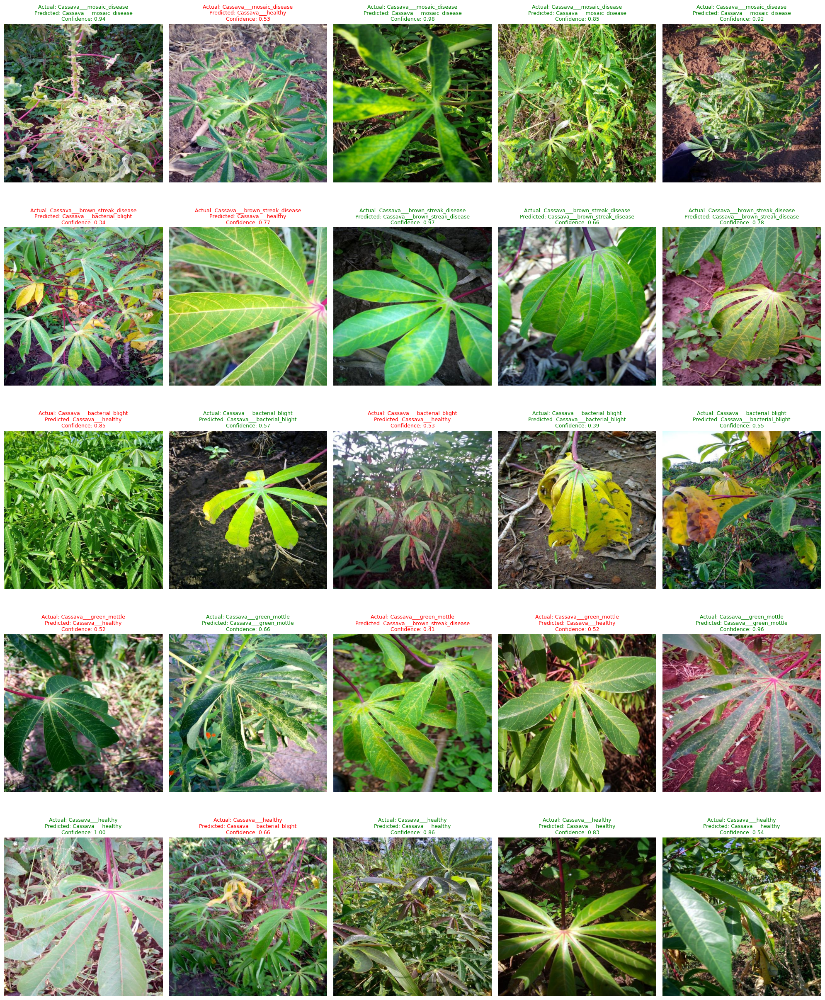

In [67]:
from tensorflow.keras.preprocessing import image
from tensorflow.keras.applications.efficientnet import preprocess_input

import matplotlib.pyplot as plt
import numpy as np
import os
import random
import glob

# =========================================================
# TEST DIRECTORY
# =========================================================

TEST_DIR = "/kaggle/input/datasets/aliyachomo/pantvillege1/test/"

# =========================================================
# CLASS NAMES
# =========================================================

class_names = {

    0: 'Cassava___bacterial_blight',

    1: 'Cassava___brown_streak_disease',

    2: 'Cassava___green_mottle',

    3: 'Cassava___healthy',

    4: 'Cassava___mosaic_disease'

}

# =========================================================
# CREATE FIGURE
# =========================================================

plt.figure(figsize=(20,25))

plot_index = 1

# =========================================================
# LOOP THROUGH EACH CLASS
# =========================================================

for class_folder in os.listdir(TEST_DIR):

    class_path = os.path.join(TEST_DIR, class_folder)

    # =====================================================
    # GET ALL IMAGES
    # =====================================================

    image_paths = glob.glob(class_path + "/*.jpg")

    # =====================================================
    # SELECT 5 RANDOM IMAGES
    # =====================================================

    sample_images = random.sample(

        image_paths,

        min(5, len(image_paths))

    )

    # =====================================================
    # LOOP THROUGH IMAGES
    # =====================================================

    for img_path in sample_images:

        # =================================================
        # LOAD IMAGE
        # =================================================

        img = image.load_img(

            img_path,

            target_size=(224,224)

        )

        # =================================================
        # PREPROCESS IMAGE
        # =================================================

        img_array = image.img_to_array(img)

        img_array = np.expand_dims(

            img_array,

            axis=0

        )

        img_array = preprocess_input(img_array)

        # =================================================
        # PREDICT IMAGE
        # =================================================

        prediction = model.predict(

            img_array,

            verbose=0

        )

        predicted_class = np.argmax(prediction)

        predicted_label = class_names[predicted_class]

        confidence = np.max(prediction)

        # =================================================
        # ACTUAL LABEL
        # =================================================

        actual_label = os.path.basename(

            os.path.dirname(img_path)

        )

        # =================================================
        # TITLE COLOR
        # =================================================

        color = "green"

        if actual_label != predicted_label:

            color = "red"

        # =================================================
        # DISPLAY IMAGE
        # =================================================

        plt.subplot(5, 5, plot_index)

        display_img = image.load_img(img_path)

        plt.imshow(display_img)

        # =================================================
        # TITLE
        # =================================================

        plt.title(

            f"Actual: {actual_label}\n"
            f"Predicted: {predicted_label}\n"
            f"Confidence: {confidence:.2f}",

            color=color,

            fontsize=9

        )

        plt.axis('off')

        plot_index += 1

# =========================================================
# SHOW IMAGES
# =========================================================

plt.tight_layout()

plt.show()

In [71]:
import tensorflow as tf

# =========================================================
# LOAD BEST MODEL
# =========================================================

model = tf.keras.models.load_model(
    "/kaggle/working/best_model.keras"
)

# =========================================================
# CONVERT TO TFLITE
# =========================================================

converter = tf.lite.TFLiteConverter.from_keras_model(model)

# Optional optimizations
converter.optimizations = [tf.lite.Optimize.DEFAULT]

# Convert model
tflite_model = converter.convert()

# =========================================================
# SAVE TFLITE MODEL
# =========================================================

with open(
    "/kaggle/working/cassavanewdataefficientnetb0_model.tflite",
    "wb"
) as f:

    f.write(tflite_model)

print("TFLite Model Saved Successfully 🚀")

INFO:tensorflow:Assets written to: /tmp/tmpf3g2wwyy/assets


INFO:tensorflow:Assets written to: /tmp/tmpf3g2wwyy/assets


Saved artifact at '/tmp/tmpf3g2wwyy'. The following endpoints are available:

* Endpoint 'serve'
  args_0 (POSITIONAL_ONLY): TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name='input_layer_3')
Output Type:
  TensorSpec(shape=(None, 5), dtype=tf.float32, name=None)
Captures:
  137388521921936: TensorSpec(shape=(1, 1, 1, 3), dtype=tf.float32, name=None)
  137388521927120: TensorSpec(shape=(1, 1, 1, 3), dtype=tf.float32, name=None)
  137388514988816: TensorSpec(shape=(), dtype=tf.resource, name=None)
  137388514989008: TensorSpec(shape=(), dtype=tf.resource, name=None)
  137388514989968: TensorSpec(shape=(), dtype=tf.resource, name=None)
  137388514988624: TensorSpec(shape=(), dtype=tf.resource, name=None)
  137388514986512: TensorSpec(shape=(), dtype=tf.resource, name=None)
  137388514986896: TensorSpec(shape=(), dtype=tf.resource, name=None)
  137388514987664: TensorSpec(shape=(), dtype=tf.resource, name=None)
  137388514986320: TensorSpec(shape=(), dtype=tf.resource, name=Non

W0000 00:00:1779303438.685521      57 tf_tfl_flatbuffer_helpers.cc:365] Ignored output_format.
W0000 00:00:1779303438.685565      57 tf_tfl_flatbuffer_helpers.cc:368] Ignored drop_control_dependency.
I0000 00:00:1779303438.891957      57 mlir_graph_optimization_pass.cc:425] MLIR V1 optimization pass is not enabled


TFLite Model Saved Successfully 🚀
